# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в анализ данных" </center>

# <center> Лабораторная работа №2. Кластерный анализ. </center>

# Часть 1

В данном задании вам необходимо **самостоятельно** реализовать один из алгоритмов кластеризации.  
По аналогии с классами в scikit-learn, нужно реализовать класс, наследуемый от [Base Estimator](https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html).  
Подробнее про реализацию своих моделей в scikit-learn: [here](https://scikit-learn.org/stable/developers/develop.html#rolling-your-own-estimator).  
В классе помимо `__init__()` нужно реализовать два метода:
 - `fit()` - метод, выполняющий кластеризацию данных.
 - `predict()` - метод, определяющий для нового объекта, к какому из кластеров он относится. 
 
Для удобства можно создавать дополнительные методы класса, которые будут вызываться в `fit()` или `predict()`.  <br>
Функции для вычисления расстояний *между объектами* самим реализовывать не нужно, используйте реализации из `scipy`.

In [147]:
# Не до конца получилось реализовать на момент отправления работы

import numpy as np
from scipy.spatial import distance
from sklearn.base import BaseEstimator, ClusterMixin

class My_Clust(BaseEstimator, ClusterMixin):
    """
    My implementation of clustering algorithm  
    """
    
    def __init__(self, n_clusters=8, init='k-means++', n_init=10, max_iter=500, tol=0.0001):
        self.inertia_ = 0
        self.cluster_centers_ = list()
        self.labels_ = list()
        self.X_ = None
        self.y_ = None
        self.size_ = 0
        self.n_clusters = n_clusters
        self.init = init
        self.n_init = n_init
        self.max_iter = max_iter
        self.tol = tol
        
    def get_labels(self):
        return self.labels_

    def get_params(self, deep=True):
        return {
            "n_clusters": self.n_clusters,
            "init": self.init,
            "n_init": self.n_init,
            "max_iter": self.max_iter,
            "tol": self.tol,
        }

    def set_params(self, **params):
        for parameter, value in params.items():
            setattr(self, parameter, value)
        return self
        
    def fit(self, X, y=None):
        self.X_ = np.array(X)
        self.size_ = len(self.X_)
        solutions_list = list()
        
        n, p = X.shape
        for i in range(self.n_init):
            self.cluster_centers_ = list()
            self.labels_ = [0 for i in range(self.size_)]
            
            centers = np.random.choice(n, size=self.n_clusters, replace=False)
            centers = X[centers, :]
            
            center_buf = centers
            center_buf_2 = centers
            
            clusters_result = [] 
            distances = np.zeros((n, self.n_clusters))
            
            for loop in range(self.max_iter):
                center_buf_2 = center_buf
                for i in range(n):
                    for j in range(self.n_clusters):
                        distances[i, j] = distance.euclidean(X[i], center_buf[j])
                    clusters_result = np.argmin(distances, 1)

                for i in range(self.n_clusters):
                    check = False
                    for j in range(n):
                        if (clusters_result[j] == i):
                            check = True
                    if (check):
                        center_buf[i] = np.mean(X[clusters_result == i], 0)
                        self.labels_ = clusters_result
            
            return self
    
    
my_kmeans = My_Clust(n_clusters=3, init='k-means++')
my_kmeans.fit(iris.data)

My_Clust(init='k-means++', max_iter=500, n_clusters=3, n_init=10, tol=0.0001)

### Вариант №3

Алгоритм K-Means.  
  
Параметры: 
- **k:** число центров (кластеров);
- **init**: метод инициализации центров - random или kmeans++;
- **n_init**: число запусков алгоритма;
- **max_iter:** максимальное число итераций;  
- **tol:** минимальное значение изменения целевой функции.  
  
Атрибуты:  
- **inertia_:** Итоговое значение целевой функции;
- **cluster\_centers\_:** центры кластеров - ndarray of shape (n_clusters, n_features);
- **labels_:** метки кластеров для каждого объекта.  
  
Метод `predict()`:  Новый объект определяется в кластер, центр которого расположен ближе всех к этому объекту. 

### Тестирование 

Вашу реализацию необходимо сравнить с питоновской реализацией алгоритма из `sklearn` или `scipy`. Результаты кластеризации должны совпадать.  
Также необходимо сравнить скорость работы вашей реализации и питоновской (это нормально, если ваша реализация будет медленнее).  
Сравнение необходимо выполнить на наборе данных iris.

In [116]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns

In [117]:
iris = load_iris()
X = iris.data # использовать для кластеризации
y = iris.target # истинные метки цветков

In [118]:
X = pd.DataFrame(X, columns=iris.feature_names)
X['class'] = [iris.target_names[i] for i in y]

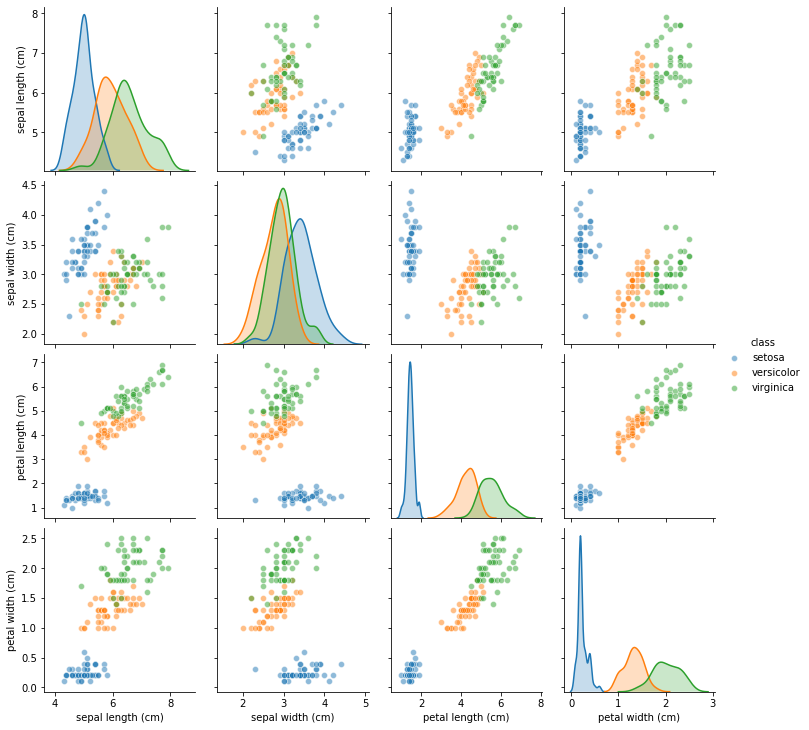

In [119]:
sns.pairplot(X, hue='class', plot_kws={'alpha':0.5}, vars=iris.feature_names)
plt.show()

### Бонусное  
  
Дополнительно вы можете поработать над эффективностью алгоритма по скорости и памяти, добавить поддержку многопоточности, или расширить базовый функционал.

In [148]:
import time

iris_p = iris.data.copy()
my_kmeans = My_Clust(n_clusters=3, init='k-means++')
start_time = time.clock()
my_kmeans.fit(iris_p)
my_time = time.clock() - start_time
labels = my_kmeans.get_labels()
iris_p['class'] = labels
sns.pairplot(iris_p, hue='class', plot_kws={'alpha': 0.75}, vars=iris.feature_names)
plt.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices




# Часть 2

В данном задании вам предлагается проанализировать набор данных по различным городам США. Каждый город характеризуется следующими признаками:

In [5]:
pd.set_option('display.max_colwidth', None)

In [6]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,Attribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temperature variation, heating- and cooling-degree days, freezing days, zero-degree days, ninety-degree days."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, medical schools, cardiac rehabilitation centers, comprehensive cancer treatment centers, hospices, insurance/hospitalization costs index, flouridation of drinking water, air pollution."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Interstate highways, air service, passenger rail service."
6,Education,"Pupil/teacher ratio in the public K-12 system, effort index in K-12, accademic options in higher education."
7,The Arts,"Museums, fine arts and public radio stations, public television stations, universities offering a degree or degrees in the arts, symphony orchestras, theatres, opera companies, dance companies, public libraries."
8,Recreation,"Good restaurants, public golf courses, certified lanes for tenpin bowling, movie theatres, zoos, aquariums, family theme parks, sanctioned automobile race tracks, pari-mutuel betting attractions, major- and minor- league professional sports teams, NCAA Division I football and basketball teams, miles of ocean or Great Lakes coastline, inland water, national forests, national parks, or national wildlife refuges, Consolidated Metropolitan Statistical Area access."
9,Economics,"Average household income adjusted for taxes and living costs, income growth, job growth."


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

<br>  
  
## Задания: 

1. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки Place, Long и Lat.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as h

In [98]:
data = pd.read_csv('Data.txt', sep=' ')
data

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


In [42]:
# Стандартизация данных
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()
data_updated = data[['Climate', 'HousingCost', 'HlthCare', 'Crime', 'Transp' , 'Educ', 'Arts', 'Recreat', 'Econ', 'Pop']]
data_transformed = minmax.fit_transform(data_updated)
data_scaled = pd.DataFrame(data_transformed, columns=data_updated.columns)

In [43]:
data_scaled

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,0.516770,0.056328,0.024849,0.280822,0.385829,0.507692,0.016651,0.245556,0.661572,0.005859
1,0.583851,0.161193,0.206609,0.263927,0.499733,0.354327,0.097225,0.518222,0.188176,0.072759
2,0.450932,0.117959,0.073652,0.302283,0.185294,0.412981,0.003263,0.124222,0.317952,0.006038
3,0.460870,0.148747,0.177789,0.137900,0.767112,0.816346,0.081192,0.292667,0.406489,0.094136
4,0.688199,0.174991,0.231843,0.536530,0.723663,0.637019,0.078387,0.513778,0.386734,0.043458
...,...,...,...,...,...,...,...,...,...,...
324,0.567702,0.192414,0.225695,0.169863,0.333957,0.768269,0.030551,0.135556,0.287671,0.041414
325,0.534161,0.069314,0.035097,0.364384,0.345722,0.379808,0.016651,0.408889,0.279885,0.013357
326,0.540373,0.173800,0.085820,0.060274,0.150000,0.577885,0.017110,0.120444,0.274117,0.038776
327,0.577640,0.100752,0.135007,0.287671,0.297995,0.586058,0.048419,0.228222,0.122422,0.057053


2. Выполните кластеризацию иерархическим методом.
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы.

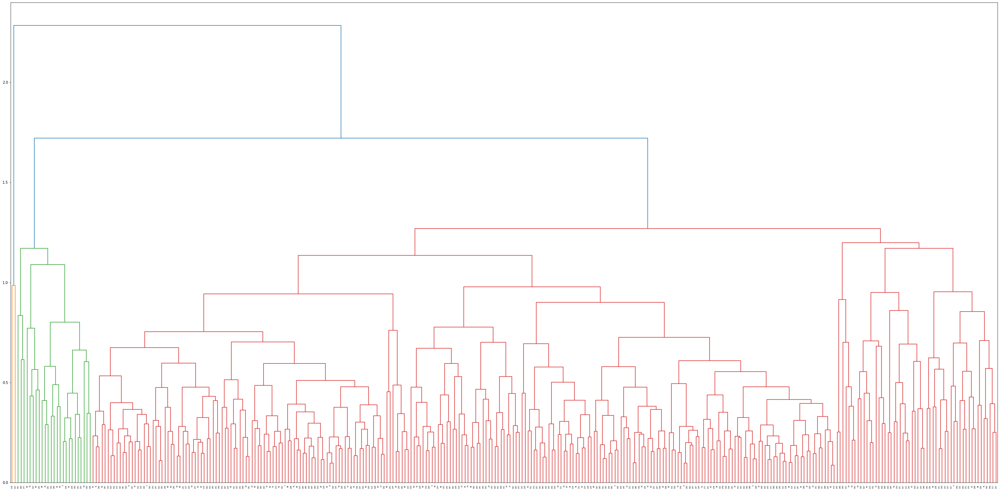

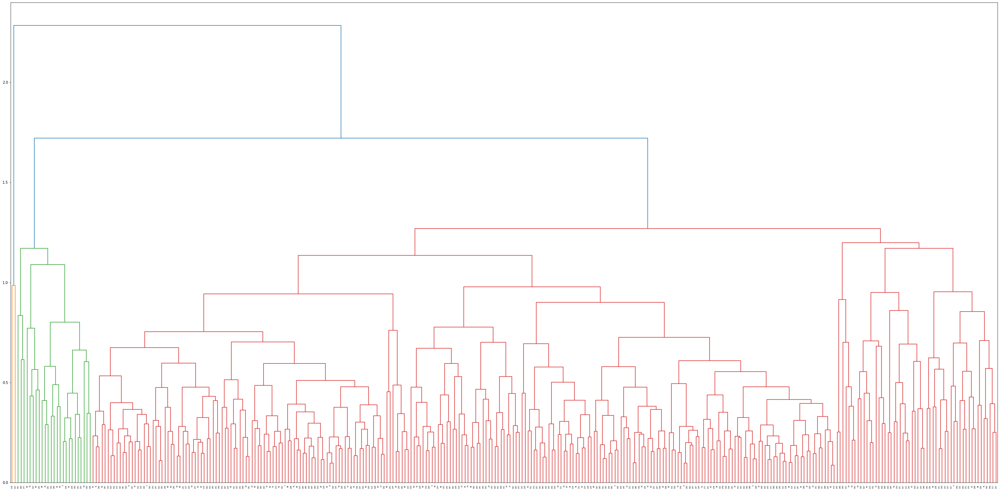

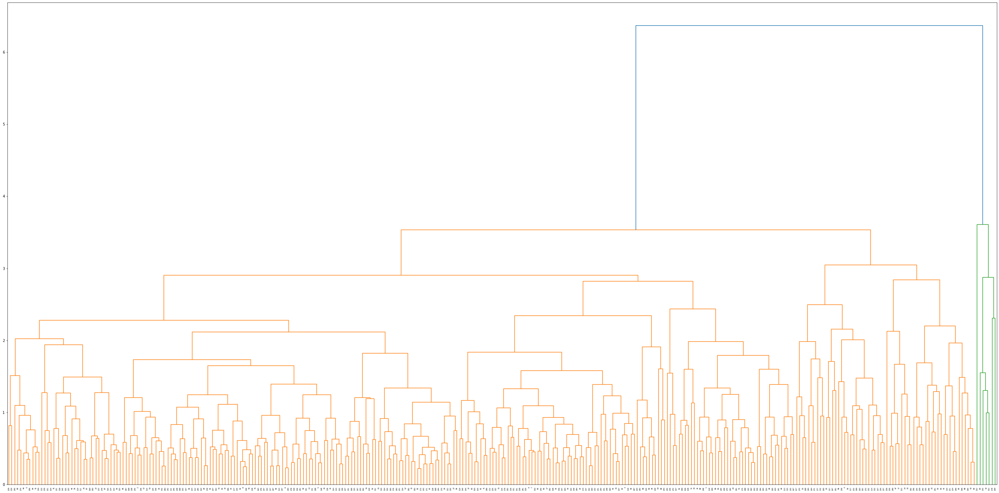

In [5]:
for m in ['euclidean', 'minkowski', 'cityblock']:
    Z = h.linkage(data_scaled, metric=m, method='complete')
    plt.figure(figsize=(50, 25))
    h.dendrogram(Z, p=50)
    plt.show()

In [11]:
from sklearn.metrics import silhouette_score

for m in ['euclidean', 'minkowski', 'cityblock']:
    Z = h.linkage(data_scaled, metric=m, method='complete')
    labels_h = h.fcluster(Z, t=3, criterion='maxclust')
    print('metric:' + m)
    print(silhouette_score(data_scaled, labels_h), '\n')

metric:euclidean
0.3105499159772473 

metric:minkowski
0.3105499159772473 

metric:cityblock
0.4863788232305954 



In [12]:
for m in ['euclidean', 'minkowski', 'cityblock']:
    Z = h.linkage(data_scaled, metric=m, method='complete')
    labels_h = h.fcluster(Z, t=4, criterion='maxclust')
    print('metric:' + m)
    print(silhouette_score(data_scaled, labels_h), '\n')

metric:euclidean
0.24667950646618347 

metric:minkowski
0.24667950646618347 

metric:cityblock
0.2517619586884782 



In [13]:
for m in ['euclidean', 'minkowski', 'cityblock']:
    Z = h.linkage(data_scaled, metric=m, method='complete')
    labels_h = h.fcluster(Z, t=5, criterion='maxclust')
    print('metric:' + m)
    print(silhouette_score(data_scaled, labels_h), '\n')

metric:euclidean
0.2373810085552441 

metric:minkowski
0.2373810085552441 

metric:cityblock
0.23008307415352233 



##### Комментарий:
Сityblock выдал результат лучше при 3-4 кластерах, в то время как при 5 кластерах euclidean & minkowski были лучше.
Сейчас и далее эффективность я буду оценивать метрикой silhouette_score

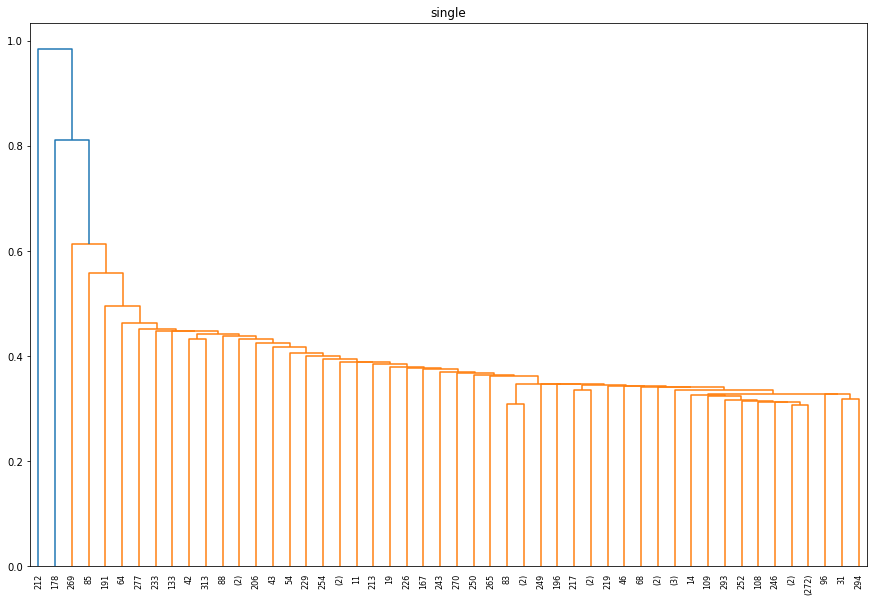

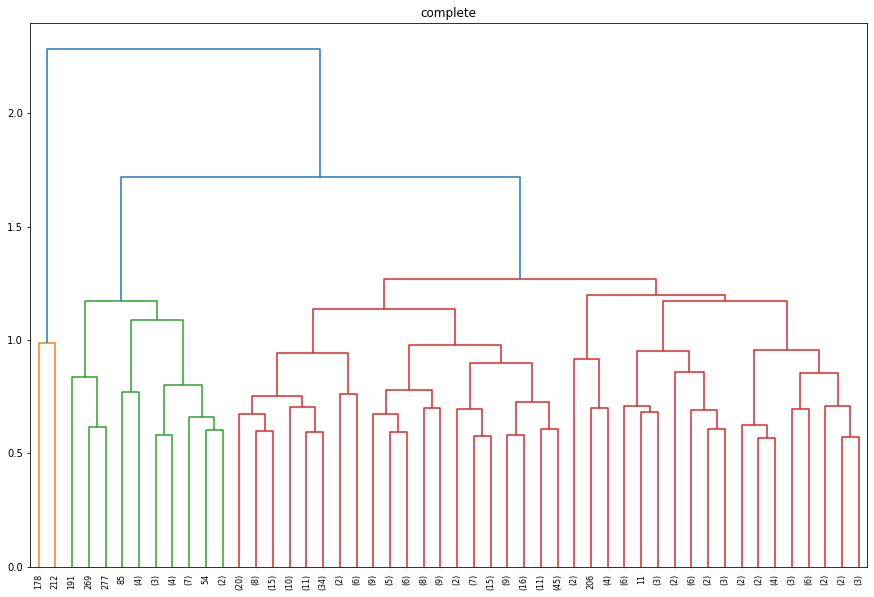

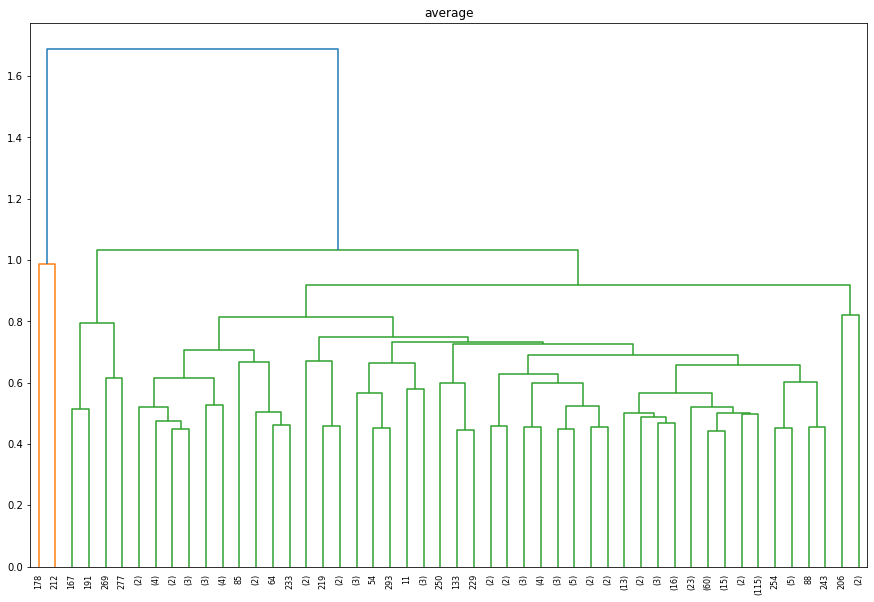

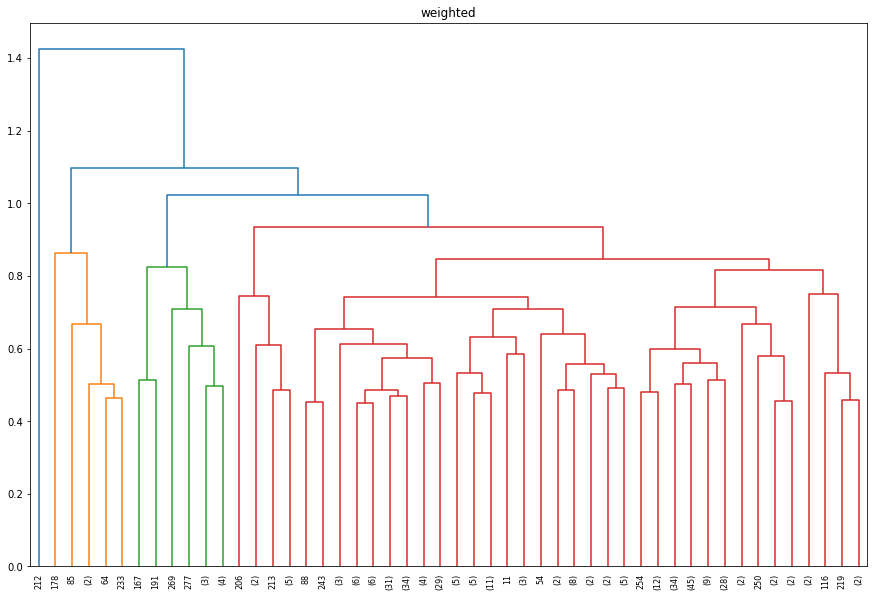

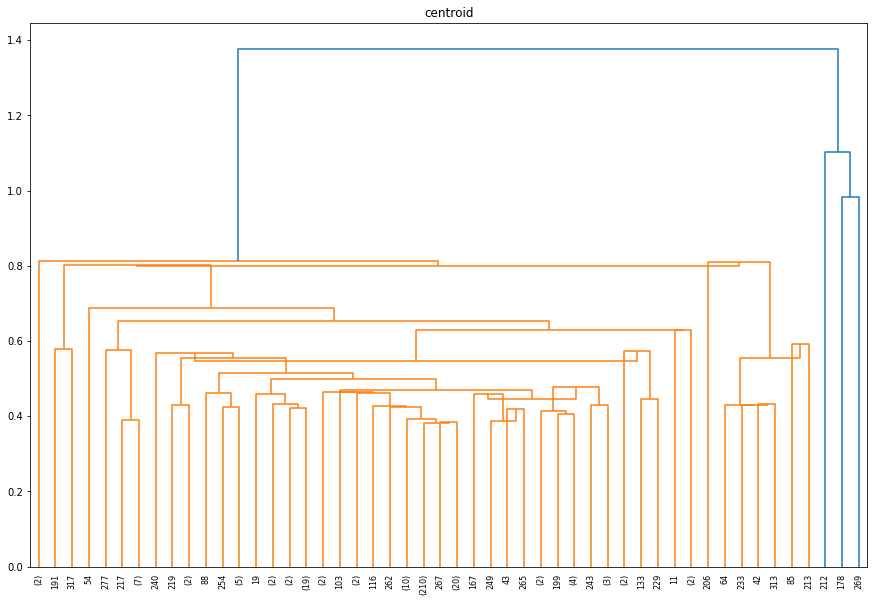

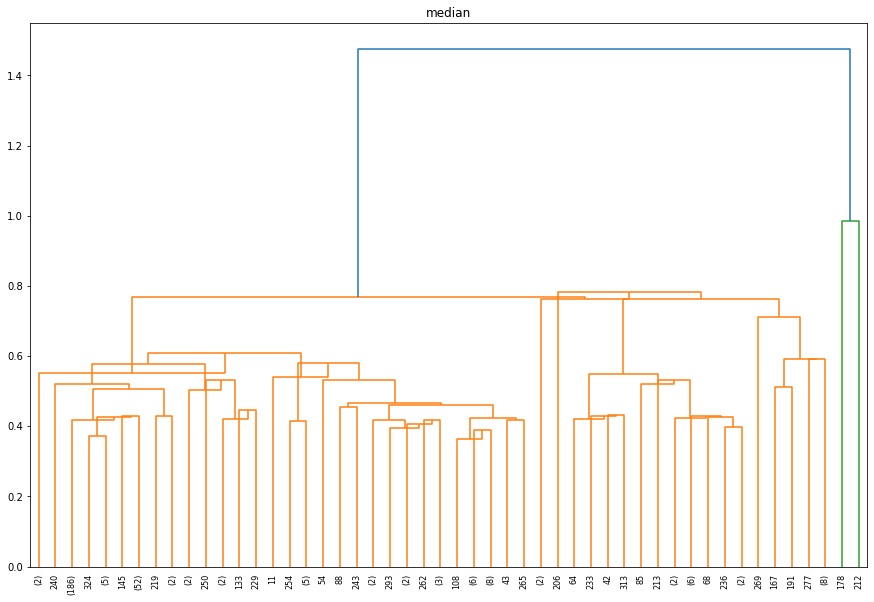

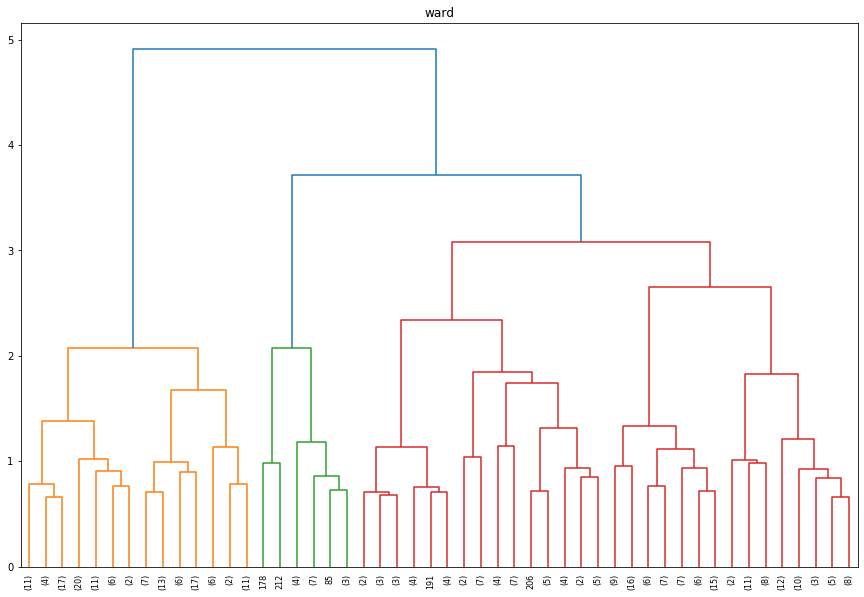

In [14]:
# Рассмотрим различные расстояниям между кластерами
for M in ['single', 'complete', 'average', 'weighted', 'centroid', 'median', 'ward']:
    Z = h.linkage(data_scaled, metric='euclidean', method=M)
    plt.figure(figsize=(15,10))
    plt.title(M)
    _=h.dendrogram(Z, p=50, truncate_mode='lastp')

In [22]:
for M in ['single', 'complete', 'average', 'weighted', 'centroid', 'median', 'ward']:
    max_score = 0
    clusters_num = 0
    for N in range(3, 10):
        Z = h.linkage(data_scaled, method=M)
        labels_h = h.fcluster(Z, t=N, criterion='maxclust')
        initial = silhouette_score(data_scaled, labels_h)
        if initial > max_score:
            max_score = initial
            clusters_num = N
    print('method:' + M + '\nclusters number:', clusters_num, '\nSilhouette score:', max_score, '\n')

method:single
clusters number: 3 
Silhouette score: 0.5641542755098847 

method:complete
clusters number: 3 
Silhouette score: 0.3105499159772473 

method:average
clusters number: 3 
Silhouette score: 0.4096425727541542 

method:weighted
clusters number: 3 
Silhouette score: 0.4581064815014018 

method:centroid
clusters number: 3 
Silhouette score: 0.5393134799144289 

method:median
clusters number: 3 
Silhouette score: 0.5641542755098847 

method:ward
clusters number: 3 
Silhouette score: 0.13781545274723117 



In [23]:
for M in ['single', 'complete', 'average', 'weighted']:
    max_score = 0
    clusters_num = 0
    for N in range(3, 10):
        Z = h.linkage(data_scaled, metric='cityblock', method=M)
        labels_h = h.fcluster(Z, t=N, criterion='maxclust')
        initial = silhouette_score(data_scaled, labels_h)
        if initial > max_score:
            max_score = initial
            clusters_num = N
    print('method:' + M + '\nclusters number:', clusters_num, '\nSilhouette score:', max_score, '\n')

method:single
clusters number: 3 
Silhouette score: 0.5641542755098847 

method:complete
clusters number: 3 
Silhouette score: 0.4863788232305954 

method:average
clusters number: 3 
Silhouette score: 0.47052961651745373 

method:weighted
clusters number: 3 
Silhouette score: 0.32370701756252884 



##### Комментарий:
Лучше всего себя показали методы single и median с количеством кластеров - 3 и метрикой euclidean. Такой же результат был у single с кол-вом кластеров - 3 и метрикой cityblock.

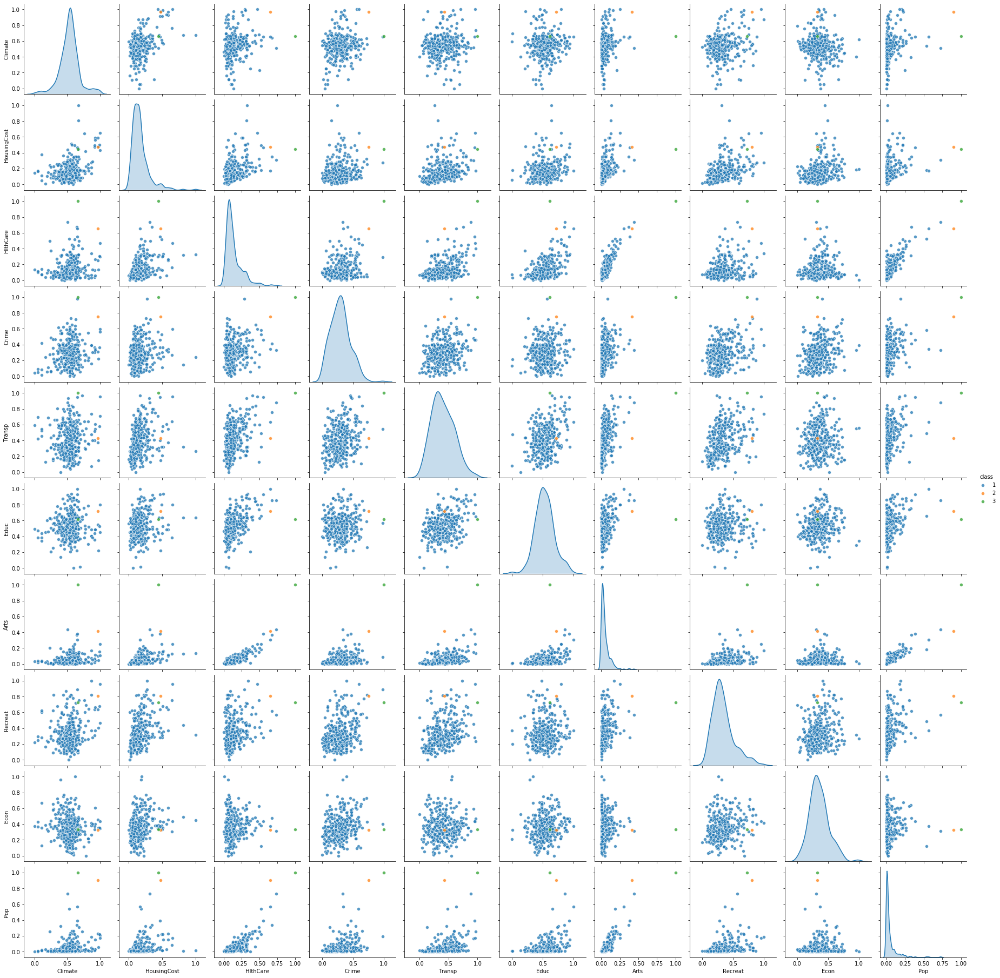

In [28]:
import warnings
warnings.filterwarnings('ignore')

data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='single', metric='euclidean')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

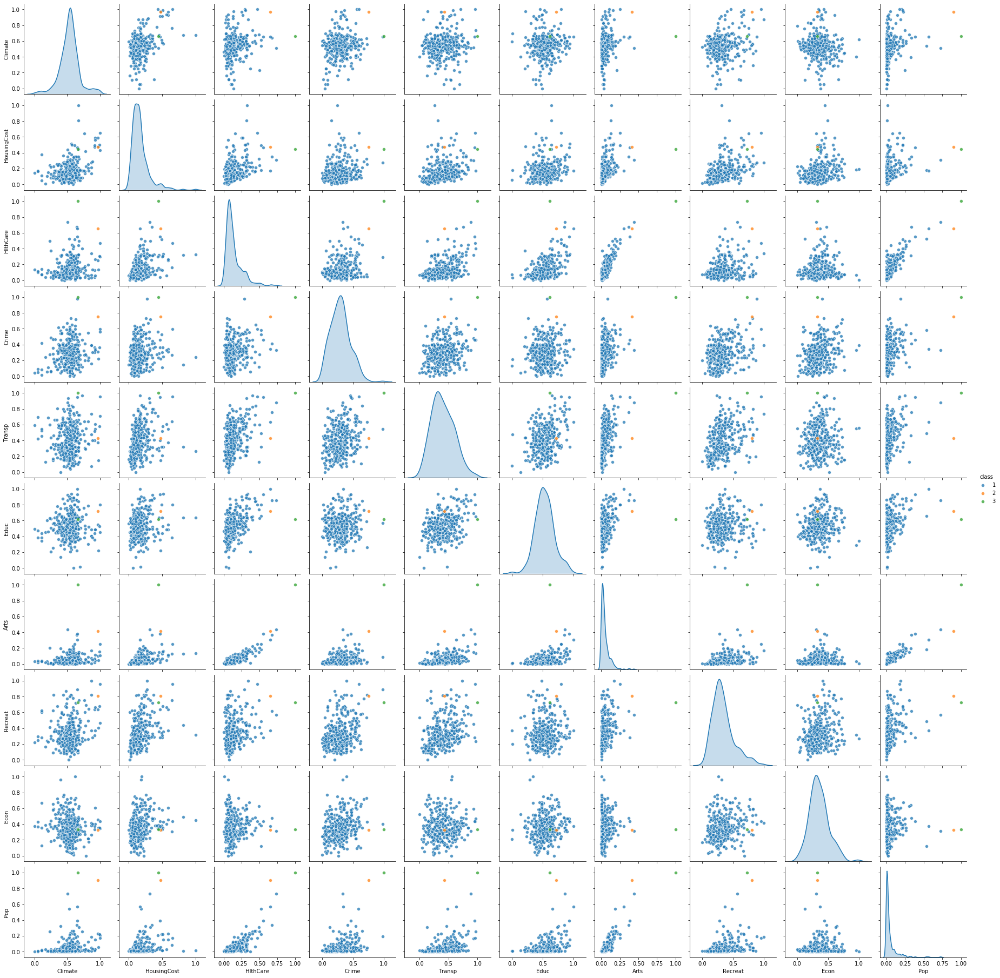

In [29]:
data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='median', metric='euclidean')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

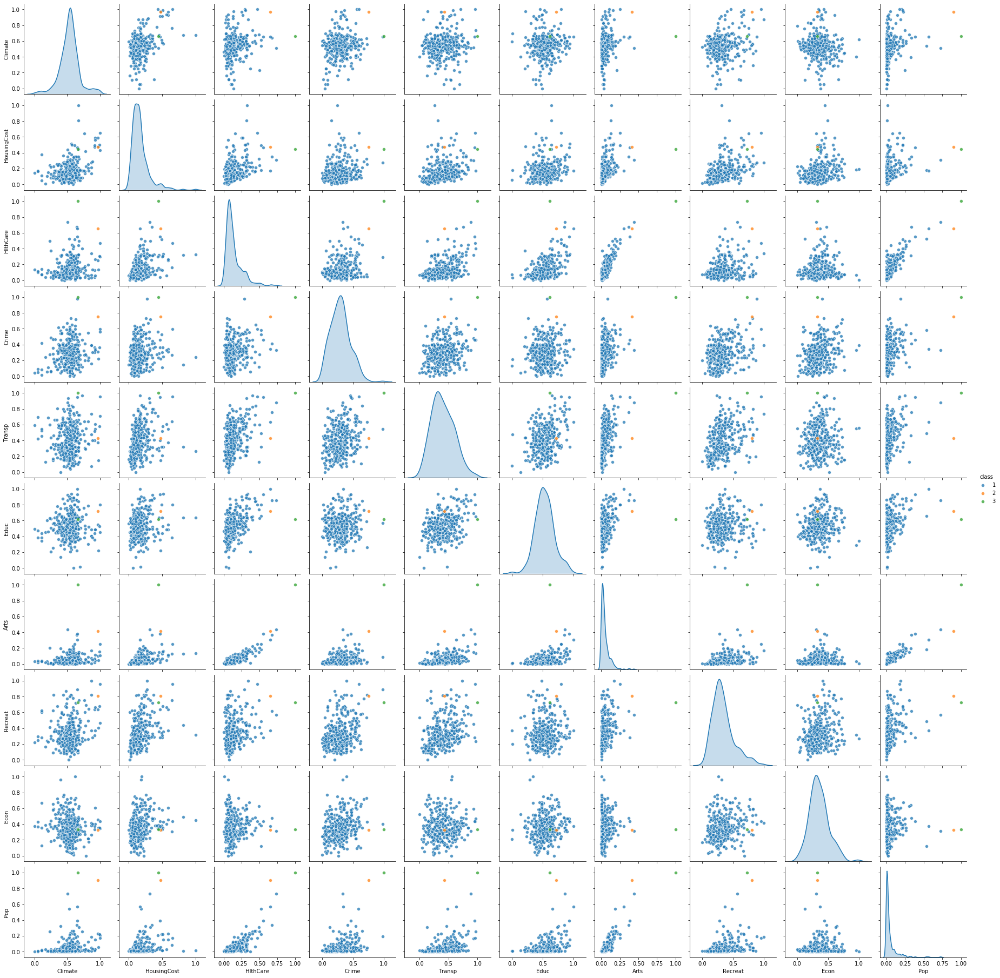

In [30]:
data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='single', metric='cityblock')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

##### Комментарий:
Несмотря на неплохой результат silhouette_score, результат вышел плохим. Существует один большой кластер, а остальные кластеры - отдельные точки. Поэтому необходимо перебрать другие вариант, которые, возможно, показали себя не так хорошо по результатам метрики.


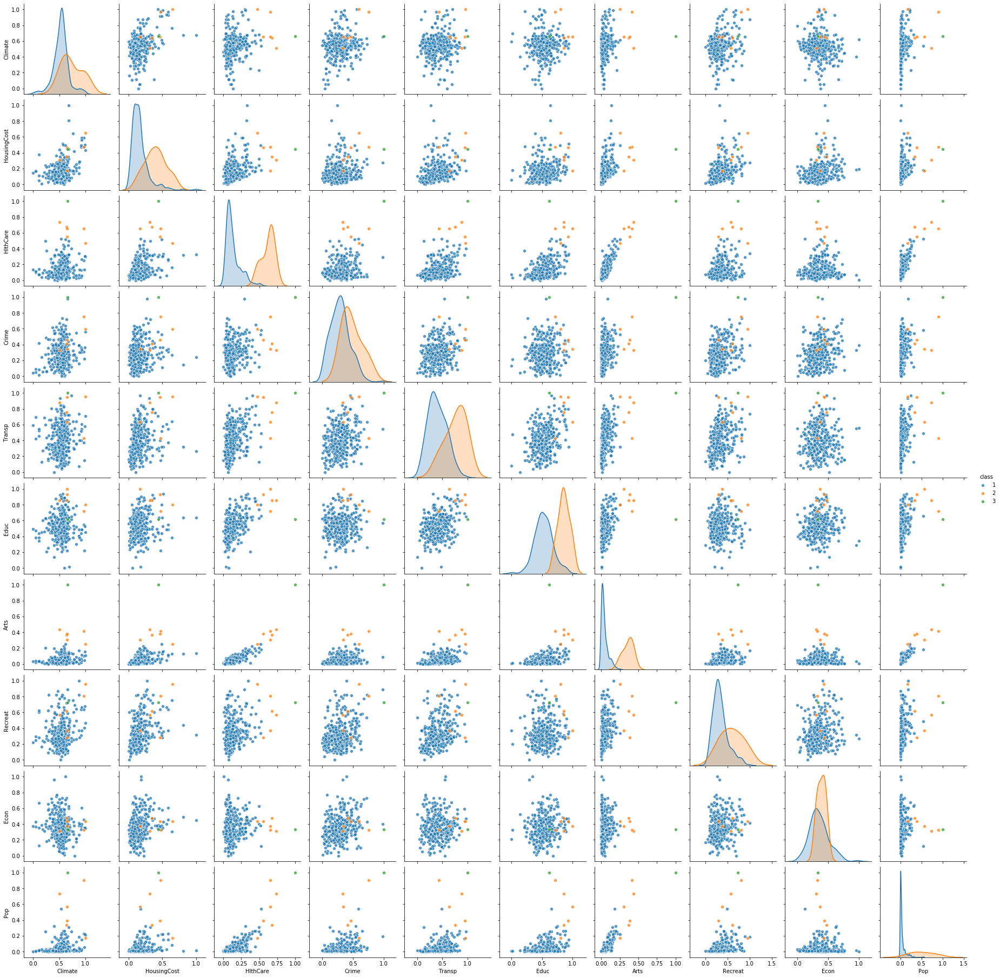

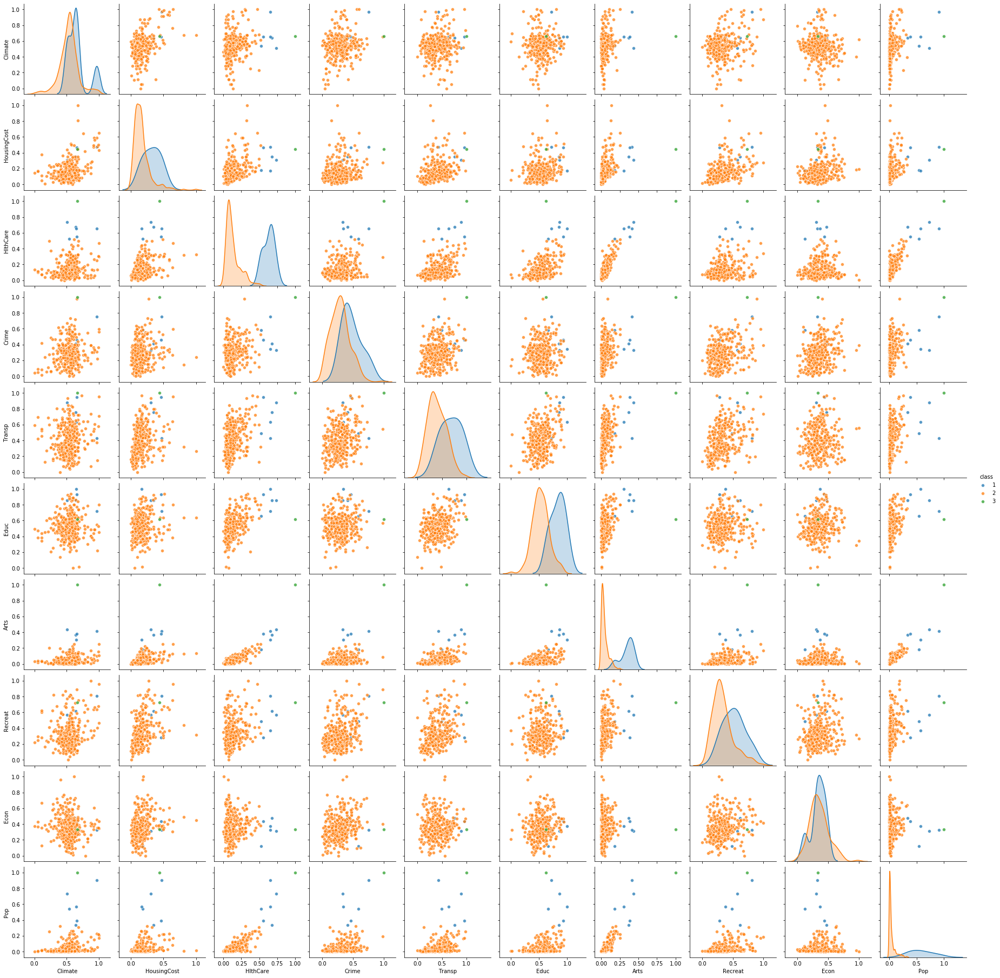

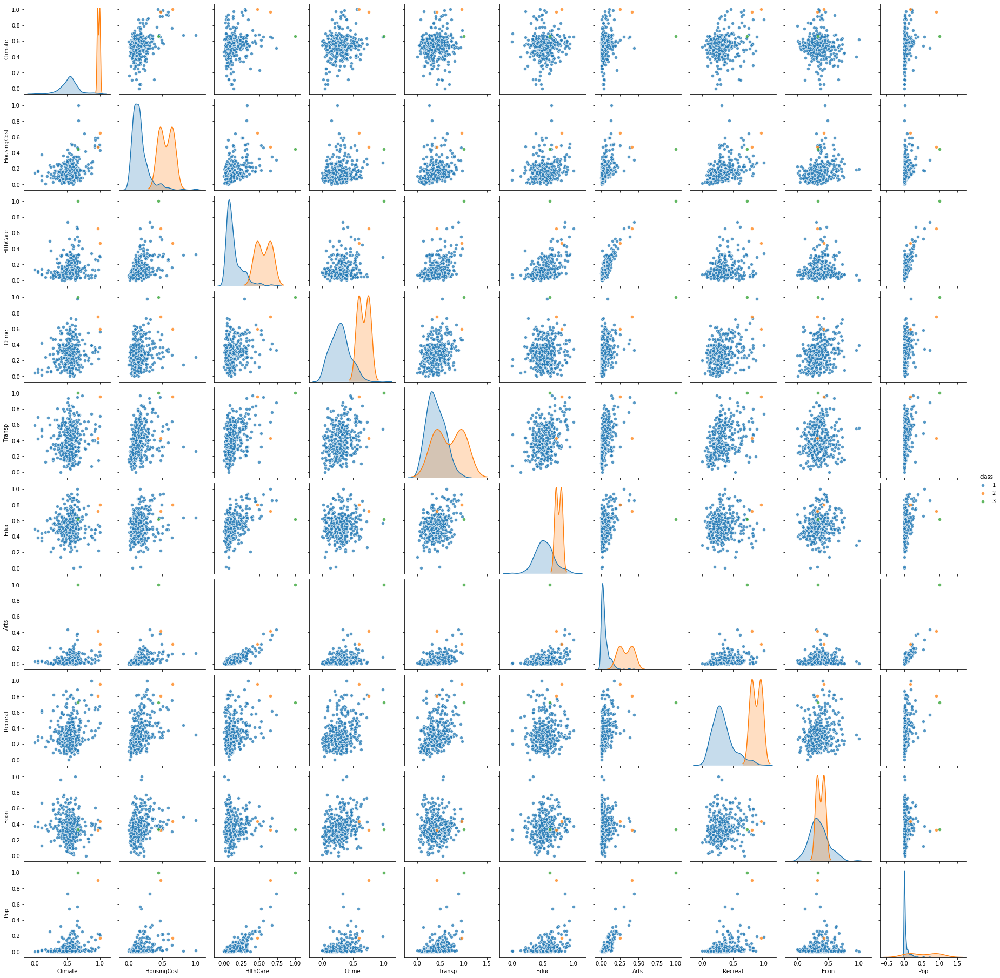

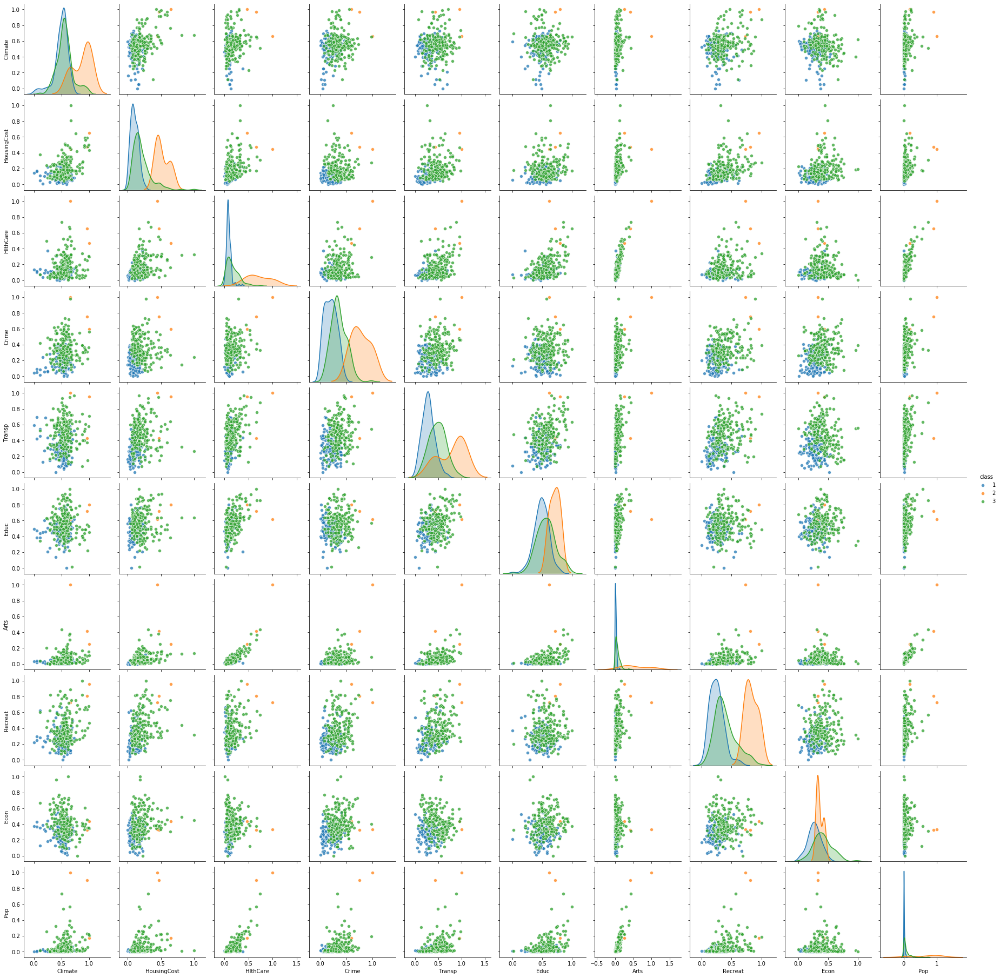

In [31]:
data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='complete', metric='cityblock')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='weighted', metric='euclidean')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

data_pred = data_scaled.copy()
h_cluster = h.linkage(data_pred, method='centroid', metric='euclidean')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

h_cluster = h.linkage(data_pred, method='ward', metric='euclidean')
labels = h.fcluster(h_cluster, t=3, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

##### Комментарий:
Визуально method='ward' и metric='euclidean' выглядят гораздо лучше, видно не один большой кластер, а несколько. Проверим еще другое кол-во кластеров.

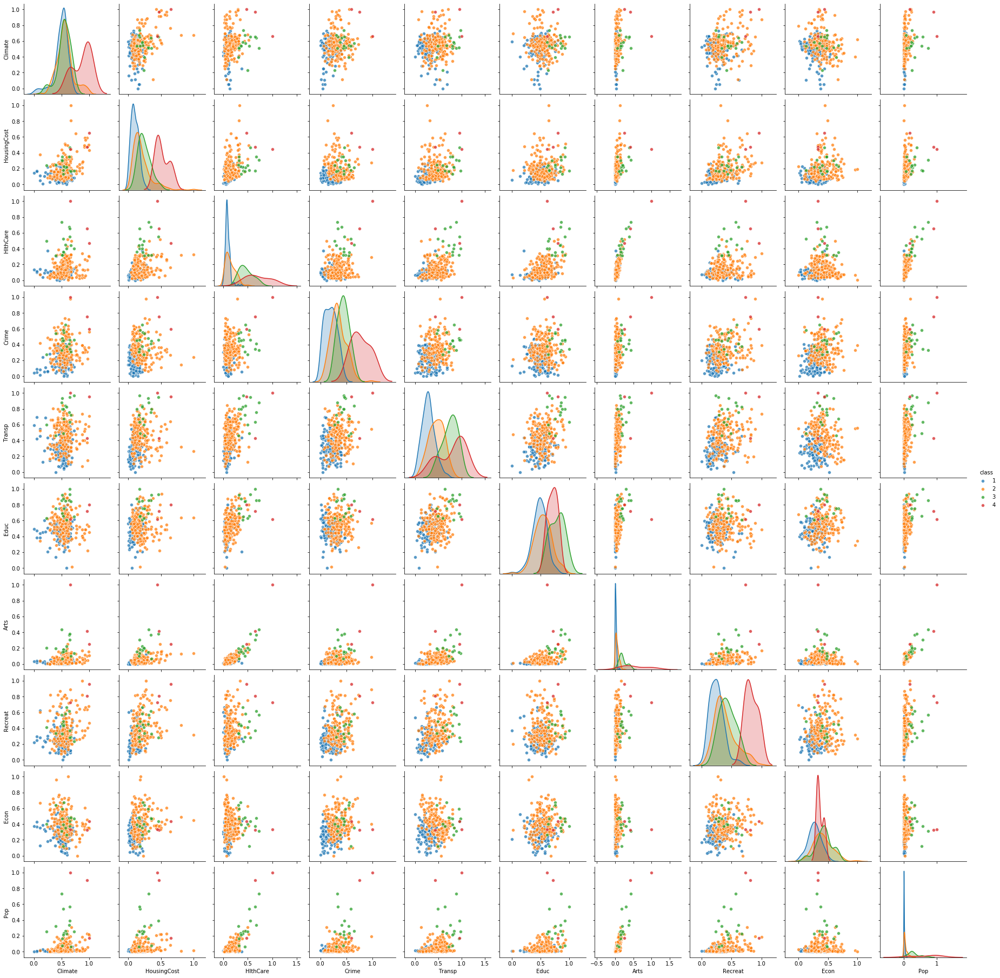

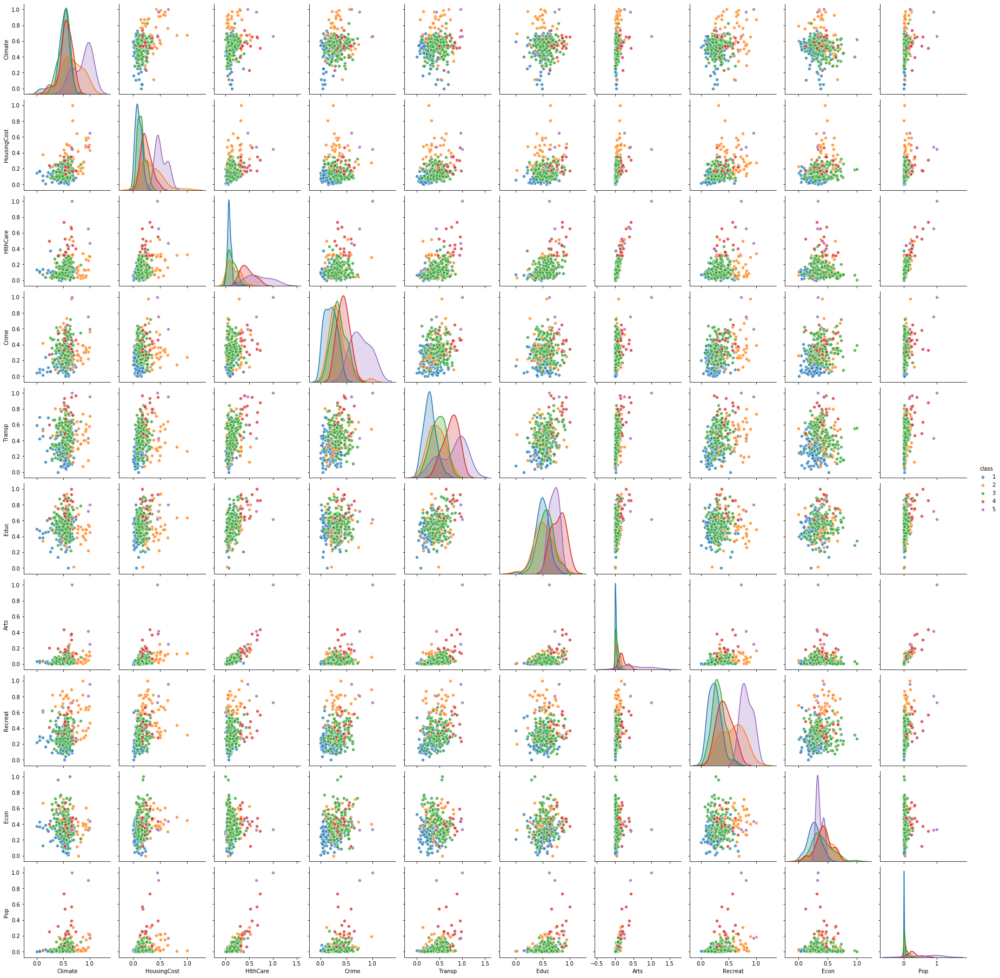

In [32]:
h_cluster = h.linkage(data_pred, method='ward', metric='euclidean')
labels = h.fcluster(h_cluster, t=4, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()
h_cluster = h.linkage(data_pred, method='ward', metric='euclidean')
labels = h.fcluster(h_cluster, t=5, criterion='maxclust')
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

##### Комментарий:
По итогу я склоняюсь к 4 кластерам, мне кажется, это оптимальное кол-во.

3. Выполните кластеризацию методом Dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.

In [38]:
from sklearn.cluster import DBSCAN
 
for E in np.arange(0.5, 3, 0.5):
    for MS in range(3, 7):
        db_cluster = DBSCAN(eps=E, min_samples=MS, metric='euclidean').fit(data_pred)
        labels = db_cluster.labels_
        print(E, MS, '\n', pd.Series(labels).value_counts(), '\n')

0.5 3 
  1    133
 0    125
 2     53
 3     14
-1      4
dtype: int64 

0.5 4 
  1    133
 0    125
 2     53
 3     13
-1      5
dtype: int64 

0.5 5 
  1    133
 0    125
 2     53
 3     13
-1      5
dtype: int64 

0.5 6 
  1    133
 0    125
 2     52
 3     13
-1      6
dtype: int64 

1.0 3 
 1    133
0    125
2     53
3     15
4      3
dtype: int64 

1.0 4 
  1    133
 0    125
 2     53
 3     15
-1      3
dtype: int64 

1.0 5 
  1    133
 0    125
 2     53
 3     15
-1      3
dtype: int64 

1.0 6 
  1    133
 0    125
 2     53
 3     15
-1      3
dtype: int64 

1.5 3 
 0    329
dtype: int64 

1.5 4 
 0    329
dtype: int64 

1.5 5 
 0    329
dtype: int64 

1.5 6 
 0    329
dtype: int64 

2.0 3 
 0    329
dtype: int64 

2.0 4 
 0    329
dtype: int64 

2.0 5 
 0    329
dtype: int64 

2.0 6 
 0    329
dtype: int64 

2.5 3 
 0    329
dtype: int64 

2.5 4 
 0    329
dtype: int64 

2.5 5 
 0    329
dtype: int64 

2.5 6 
 0    329
dtype: int64 



##### Комментарий:
Наиболее подходящими кажутся значение 1.0 для eps и min_samples = 3.

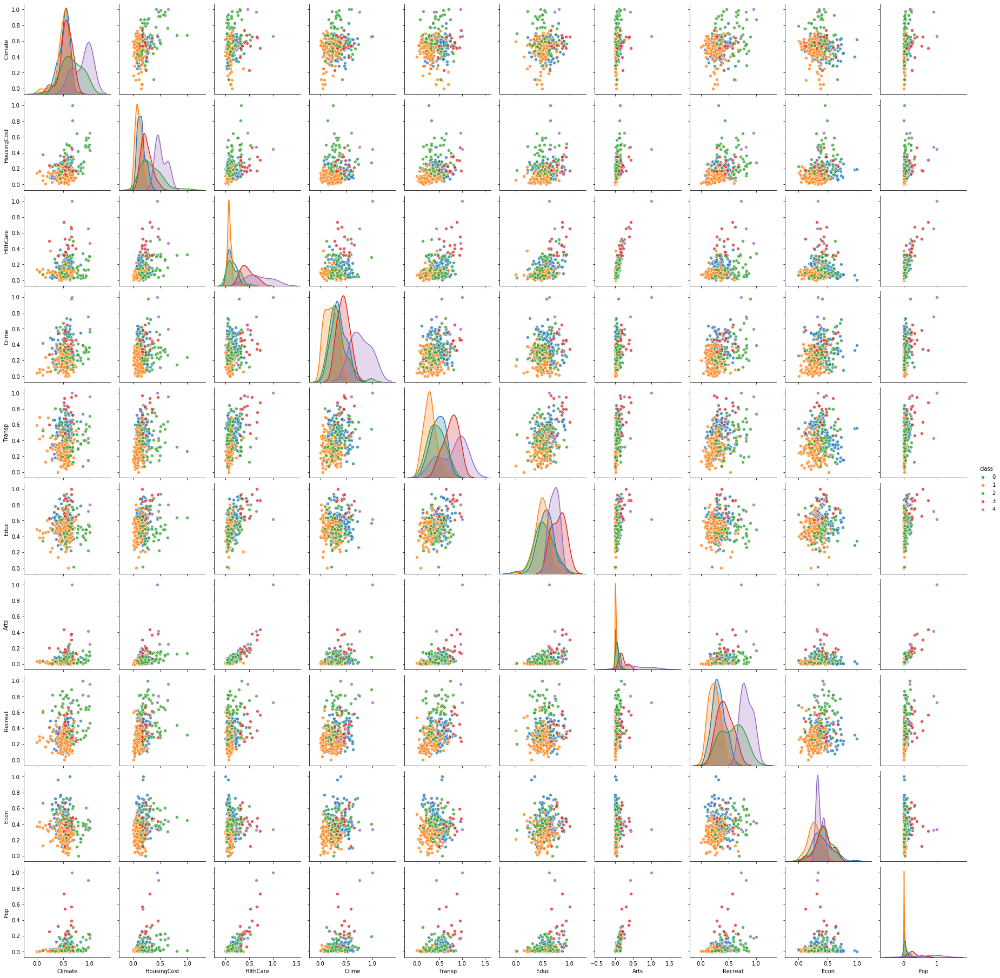

In [39]:
db_cluster = DBSCAN(eps=1.0, min_samples=3, metric='euclidean').fit(data_pred)
labels = db_cluster.labels_
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

##### Комментарий:
Мне кажется, что 5 кластеров является оптимальным количеством.

4. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.

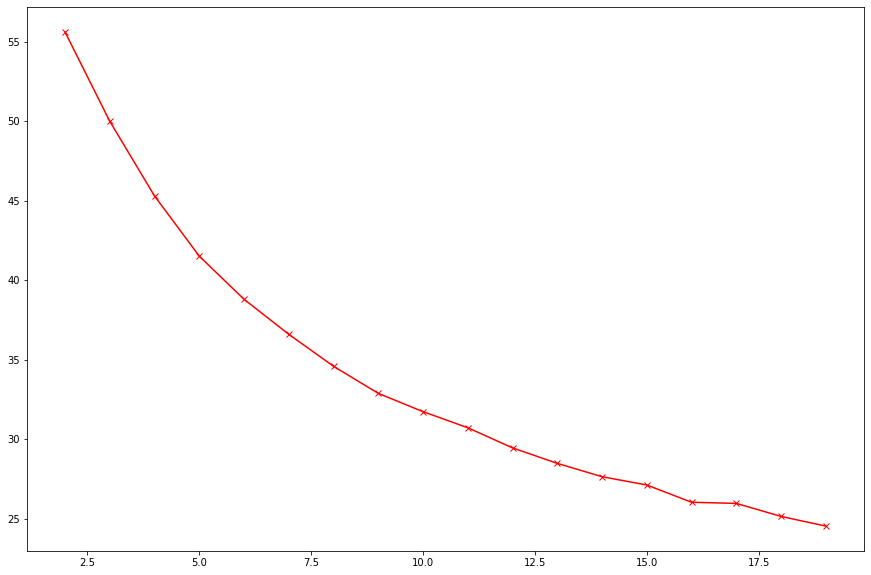

In [45]:
from sklearn.cluster import KMeans

plt.figure(figsize=(15, 10))
inertia = []
# Определяем оптимальное кол-во кластеров 
for i in range(2, 20):
    kmeans = KMeans(n_clusters=i, n_init=10)
    kmeans.fit(data_scaled)
    labels = kmeans.predict(data_scaled)
    inertia.append(kmeans.inertia_)
plt.plot(range(2, 20), inertia, 'x-r')
plt.show()

##### Комментарий:
Мне показалось, что 7 кластеров подходят в данном случае лучше всего, но я решила еще раз удостовериться в последующих экспериментах.

In [46]:
kmeans = KMeans(n_clusters=7, n_init=10)
kmeans.fit(data_scaled)
labels_kmeans = kmeans.predict(data_scaled)

In [48]:
print(labels_kmeans)
[sum(labels_kmeans==x) for x in range(7)]

[4 3 0 3 3 0 0 3 0 3 2 5 0 0 3 0 0 3 0 1 5 0 0 4 4 1 3 4 0 4 0 2 0 1 3 0 3
 3 4 0 3 3 1 5 4 4 0 2 4 4 0 4 3 0 1 0 4 3 3 5 3 3 3 0 1 3 3 0 1 4 0 3 0 3
 4 0 1 2 0 0 3 5 0 1 3 1 0 0 3 3 0 0 0 0 4 3 2 0 3 3 3 0 0 3 0 3 5 5 5 4 0
 4 3 5 5 0 4 5 3 0 3 0 0 0 0 3 3 0 0 3 1 0 2 4 1 0 4 3 0 3 3 5 4 0 3 0 0 3
 0 3 0 3 3 3 4 3 0 3 3 4 4 2 5 0 3 0 4 5 0 4 4 0 3 0 3 3 4 0 6 3 4 4 3 0 3
 4 0 4 0 5 3 5 1 3 4 1 1 3 0 2 0 0 0 0 4 3 2 0 3 1 3 5 6 1 3 5 2 2 5 4 4 0
 3 4 5 0 2 4 0 0 3 4 0 1 5 0 1 0 5 1 4 4 1 0 0 0 1 0 3 3 0 3 3 0 4 1 0 3 0
 0 4 1 3 2 2 5 4 3 2 1 2 2 2 2 4 3 0 2 0 0 4 4 0 3 3 3 3 3 4 2 0 0 4 3 2 3
 5 0 0 3 3 3 5 4 0 4 0 2 0 4 3 4 4 1 0 0 0 5 0 4 4 0 3 5 0 0 0 0 0]


[108, 26, 23, 87, 56, 27, 2]

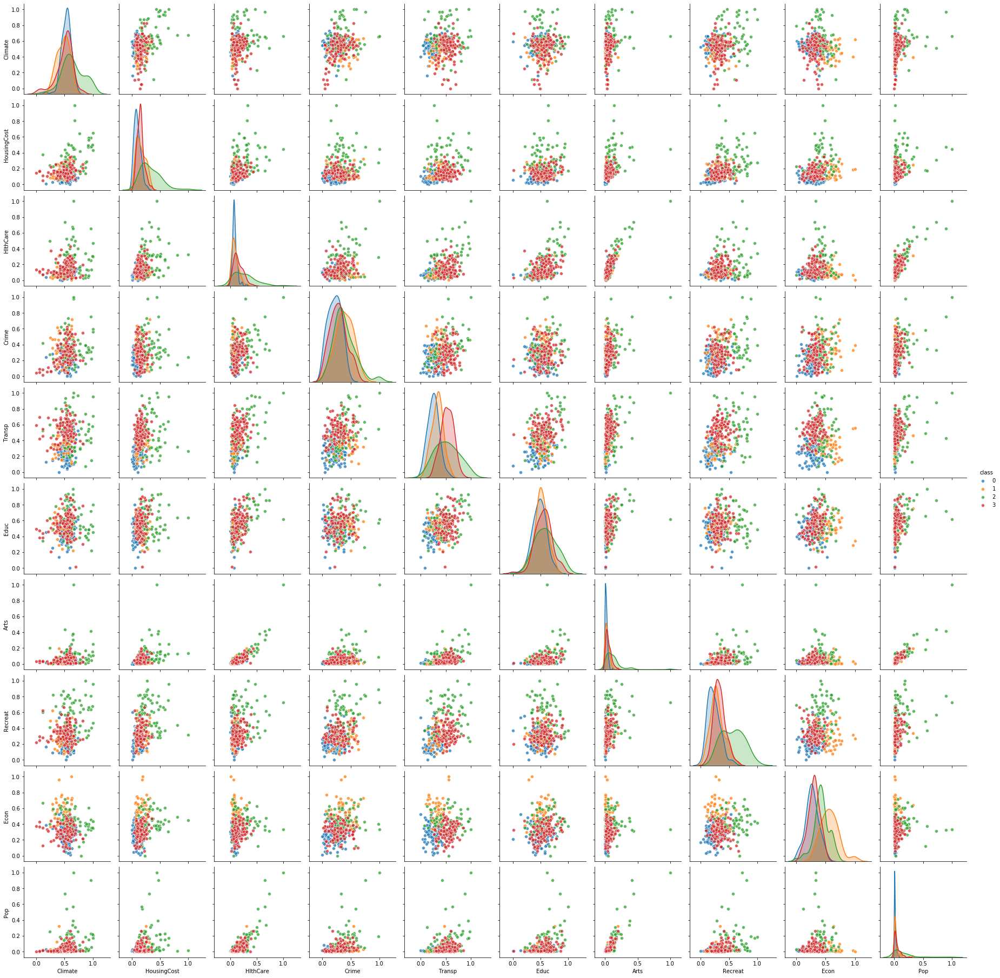

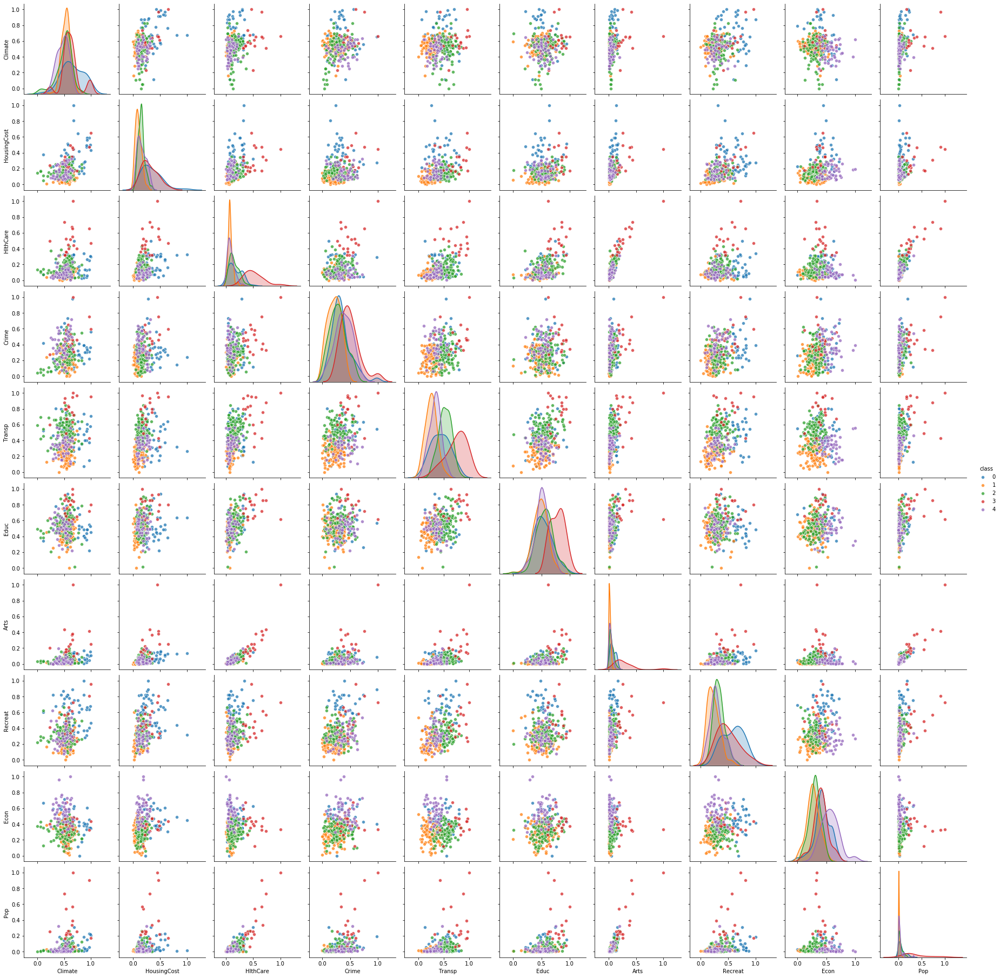

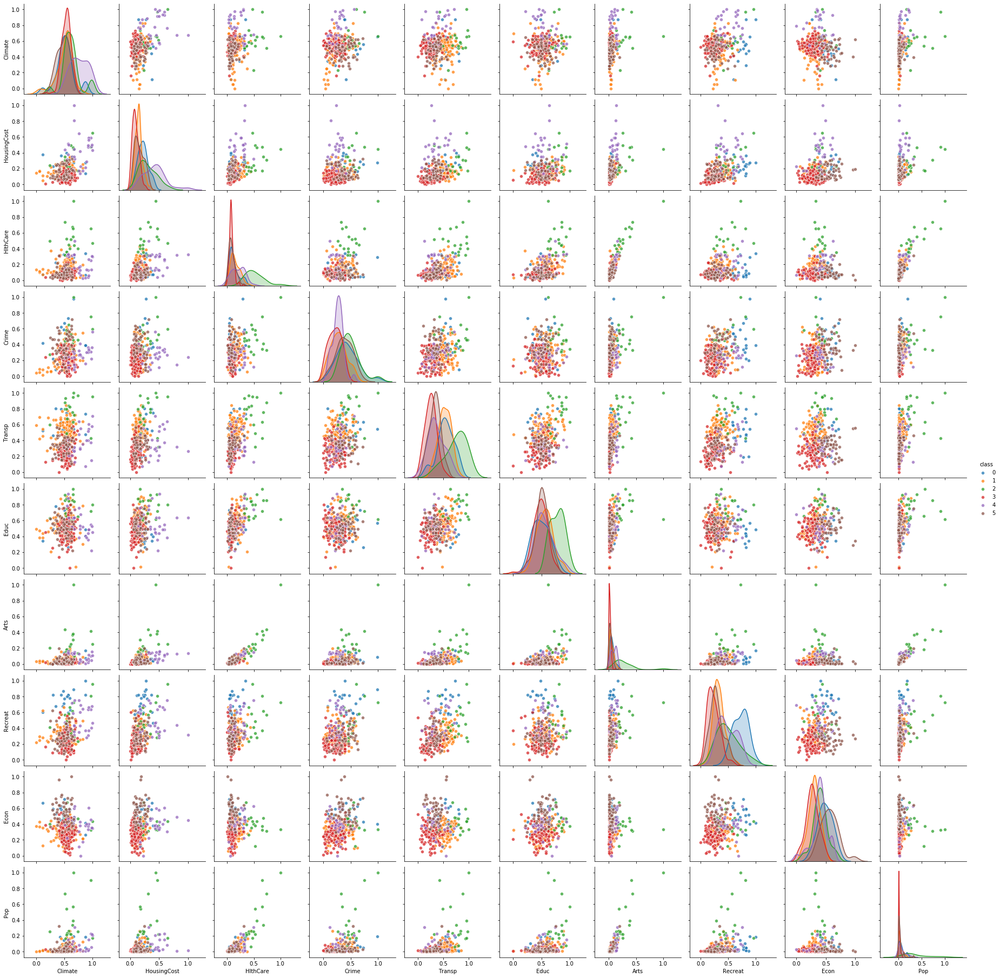

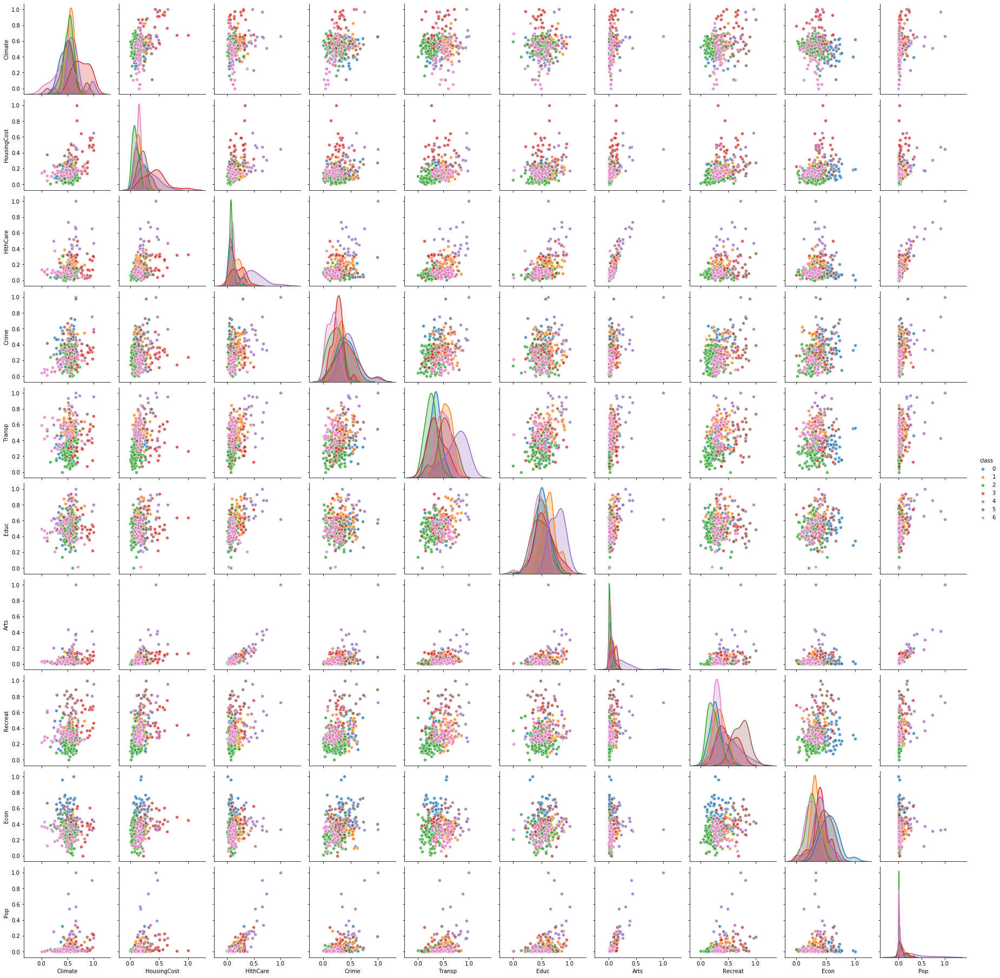

In [51]:
for N in range(4,8):
    k_cluster = KMeans(n_clusters=N, init='k-means++', random_state=3).fit(data_pred)
    labels = k_cluster.labels_
    data_pred['class'] = labels
    sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
    plt.show()

##### Комментарий:
Мне показалось, что наиболее подходящими выглядят 5 и 7 кластеров, но я все равно оставлю предпочтение последнему.

5. (Бонусное) Выполните кластеризацию другими методами. Например, HDBSCAN или алгоритмы, реализованные в 
scikit-learn.

In [86]:
from hdbscan import HDBSCAN, hdbscan

hdb_cluster = hdbscan.HDBSCAN(min_cluster_size=14, gen_min_span_tree=True)
hdb_cluster.fit(data_pred)
labels = hdb_cluster.labels_
data_pred['class'] = labels
sns.pairplot(data_pred, hue='class', plot_kws={'alpha': 0.75})
plt.show()

pd.Series(cl_hdbscan.labels_).value_counts()

ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 88 from C header, got 80 from PyObject

In [88]:
pip install numpy --upgrade

^C
ERROR: Operation cancelled by user
Note: you may need to restart the kernel to use updated packages.


6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиений объектов (по одному на 
каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).

In [63]:
# Silhouette_score

h_cluster = h.linkage(data_scaled, method='ward', metric='euclidean')
labels_h = h.fcluster(h_cluster, t=4, criterion='maxclust')

db_cluster = DBSCAN(eps=1.0, min_samples=3, metric='euclidean').fit(data_pred)
labels_db = db_cluster.labels_

k_cluster = KMeans(n_clusters=N, init='k-means++', random_state=3).fit(data_scaled)
labels_kmeans = k_cluster.labels_

In [64]:
silhouette_score(data_scaled, labels_h)

0.12768413551511812

In [65]:
silhouette_score(data_scaled, labels_db)

0.12813699798818218

In [66]:
silhouette_score(data_scaled, labels_kmeans)

0.1467314908186219

In [68]:
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz_score(data_scaled, labels_h)

53.39516043969699

In [69]:
calinski_harabasz_score(data_scaled, labels_db)

47.04335826717946

In [70]:
calinski_harabasz_score(data_scaled, labels_kmeans)

52.40918075061082

In [71]:
from sklearn.metrics import davies_bouldin_score

davies_bouldin_score(data_scaled, labels_h)

2.0707563344822466

In [72]:
davies_bouldin_score(data_scaled, labels_db)

1.7206058668443933

In [73]:
davies_bouldin_score(data_scaled, labels_kmeans)

1.6088686650731645

  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  


##### Комментарий:
Как мне показалось, наиболее подходящим разбиением вышло K-means

In [99]:
data_pred['class'] = labels_kmeans
data = [data.loc[data_pred['class'] == i] for i in range(7)]

In [100]:
data[0]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
14,"Ann-Arbor,MI",546,11014,2508,1067,3433,3346,7559,2288,4579,-83.7500,42.2830,264748
19,"Atlanta,GA",696,8316,3195,1308,8409,3057,7559,1362,6315,-84.3190,33.7630,2138231
33,"Bergen-Passaic,NJ",559,14607,2661,857,3511,3653,9304,1918,6016,-74.0590,40.8910,1292970
52,"Buffalo,NY",571,8064,2465,971,5384,3121,8567,2441,5047,-78.8750,42.8870,1015472
54,"Burlington,VT",383,9673,1809,494,7146,3323,1741,3357,6726,-73.2070,44.4750,115308
58,"Champaign-Urbana-Rantoul,IL",525,8627,672,1022,7447,3147,2203,1700,5485,-88.1983,40.1817,168392
61,"Charlotte-Gastonia-Rock-Hill,NC-SC",644,7169,999,1273,6099,3031,4313,1236,5671,-81.0173,35.1370,971391
62,"Charlottesville,VA",618,9531,1348,756,6041,3489,1422,1704,6055,-78.5070,38.0380,113568


In [101]:
data[1]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
9,"Amarillo,TX",609,6546,669,1073,4902,2852,1235,1109,6241,-101.8490,35.3830,173699
23,"Austin,TX",435,8831,782,1049,3670,3063,5355,1063,7439,-97.7420,30.2820,536688
24,"Bakersfield,CA",560,8068,420,1561,3725,2564,1222,1568,6056,-119.0220,35.3750,403089
27,"Baton-Rouge,LA",427,8083,342,1565,3329,2635,4237,1413,6308,-91.1850,30.4500,494151
29,"Beaumont-Port-Arthur,TX",423,6288,616,1313,2782,2745,1795,1813,6019,-94.0125,29.9910,375497
44,"Bradenton,FL",440,8242,333,1093,3805,2712,154,1349,7437,-82.5720,27.4950,148442
45,"Brazoria,TX",423,8394,438,768,2391,2718,1506,1512,6020,-95.5700,29.0430,169587
48,"Bristol,CT",516,10041,975,545,4495,2628,514,777,6527,-72.9500,41.6730,73762
49,"Brockton,MA",575,8263,916,1336,3810,2729,2001,1217,6900,-71.0170,42.0850,182891


In [102]:
data[2]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
5,"Alexandria,LA",520,5819,640,727,2444,2972,334,1018,5254,-92.4530,31.3020,135282
6,"Allentown,Bethlehem,PA-NJ",559,8288,621,514,2881,3144,2333,1117,5097,-75.4405,40.6155,635481
8,"Altoona,PA",561,6191,432,399,4246,2778,256,1210,4230,-78.3950,40.5150,136621
12,"Anderson,IN",530,5704,580,878,2865,2469,430,838,3370,-85.6850,40.1670,139336
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


In [103]:
data[3]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
10,"Anaheim-Santa-Ana,CA",885,16047,2025,983,3954,2843,5632,3156,6220,-117.8890,33.7990,1932709
47,"Bridgeport-Milford,CT",648,13429,2550,943,3197,3029,8368,1913,7197,-73.1265,41.2075,438557
77,"Danbury,CT",569,14420,2350,548,2715,3029,7415,1572,7060,-73.4600,41.3930,170369
132,"Honolulu,HI",717,17021,1298,891,5911,2502,7168,3703,5187,-126.0568,31.7365,762565
161,"Lake-County,IL",514,13282,1237,822,3422,2607,3746,2435,5755,-88.6180,39.6360,440372
199,"Monmouth-Ocean,NJ",615,11660,2482,819,2690,2787,7563,3544,6154,-74.0750,40.3520,849211
206,"Nassua-Suffolk,NY",656,11138,3919,566,2119,3234,8640,3705,7371,-73.3750,40.6780,2605813
216,"Norwalk,CT",648,20151,2530,625,3536,3029,7273,2268,6432,-73.3650,41.1230,126692
217,"Oakland,CA",910,13135,2362,1533,6430,2646,6162,2394,5457,-122.2680,37.8080,1761759
226,"Oxnard-Ventura,CA",890,14000,1106,791,2238,2155,2769,2135,5514,-119.2030,34.2375,529174


In [104]:
data[4]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
7,"Alton,Granite-City,IL",537,6487,965,706,4975,2945,1487,1280,5795,-90.1615,38.7940,268229
17,"Asheville,NC",694,6722,1204,566,5086,2990,1391,1542,5196,-82.5570,35.5930,160934
22,"Aurora-Elgin,IL",474,10384,1203,821,3943,2208,3857,1800,5097,-88.2805,41.8935,315607
26,"Bangor,ME",451,7277,780,651,5613,2934,1995,2148,5172,-68.7720,44.8020,83919
...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,"Tallahassee,FL",404,8029,370,1161,5530,2790,2181,1936,6021,-84.2820,30.4450,190220
299,"Toledo,OH",518,7767,1738,998,5323,2852,4389,1952,4534,-83.5280,41.5910,616864
300,"Topeka,KS",501,7110,1148,999,5348,2795,1632,1141,5464,-95.6700,39.0520,154916
304,"Tuscaloosa,AL",470,6464,674,1014,4723,2390,1432,1090,4900,-87.5670,33.2050,137541


In [105]:
data[5]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
11,"Anchorage,AK",195,12175,601,1223,5091,2414,2346,3000,7668,-127.2016,48.88046,174431
20,"Atlantic-City,NJ",615,11074,637,1878,3556,2929,621,2711,8107,-74.4380,39.36700,276385
31,"Bellingham,WA",772,8329,240,825,3776,2778,1302,3200,4247,-122.4830,48.76300,106701
43,"Boulder-Longmont,CO",459,11914,962,1088,7108,2587,3663,4012,7127,-105.1930,40.09150,189625
50,"Brownsville-Harlington,TX",440,5376,91,974,3119,2413,162,3000,4968,-97.4820,25.91900,209727
59,"Charleston,SC",569,7402,1463,1495,4207,3164,2993,2561,5153,-79.9300,32.76300,430462
81,"Daytona-Beach,FL",561,7203,723,1347,4117,2612,809,3967,6592,-81.0230,29.21500,258762
96,"Eugene-Springfield,OR",741,9370,539,874,5293,3118,2631,3400,3045,-122.9810,43.95200,275226
106,"Fort-Collins-Lover=land,CO",490,9951,731,744,2637,2413,1609,4200,6631,-105.0800,40.49000,149184
107,"Fort-Lauderdale-Hollywood-Pompano-Beach,FL",572,10810,1252,1536,4186,2734,2027,2455,7136,-80.1373,26.12100,1018200


In [106]:
data[6]

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
25,"Baltimore,MD",567,9148,3562,1730,7405,3471,9788,2925,5503,-76.617,39.2880,2199531
42,"Boston,MA",623,11609,5301,1215,6801,3479,21042,3066,6363,-71.058,42.3620,2805911
64,"Chicago,IL",514,10913,5766,1034,7742,3486,24846,2856,5205,-87.625,41.8830,6060387
85,"Detroit,MI",536,8525,4142,1587,4808,3064,10389,2483,3904,-83.128,42.4420,4488072
178,"Los-Angeles,Long-Beach,CA",885,13868,5153,1960,4345,3195,23567,3948,5316,-118.217,33.9165,7477503
212,"New-York,NY",638,13358,7850,2498,8625,2984,56745,3579,5338,-73.880,40.8490,8274961
233,"Philadelphia,PA-NJ",630,8310,5158,1059,5903,3781,17270,1979,5638,-75.163,39.9500,4716818
269,"San-Francisco,CA",910,17158,3726,1619,8299,3371,14226,4600,6063,-122.417,37.7750,1488871
313,"Washington,DC-MD-VA",631,13724,4361,1317,8236,3635,21701,1578,6072,-77.033,38.8920,3250822


##### Комментарий:
Показатель Educ не сильно отличается от класса к классу.
##### Класс 0: 
Средний HousingCost, большая Population, хорошо развит Transp
##### Класс 1: 
HousingCost ниже среднего, высокий Econ, низкий Arts, низкая Pop.
##### Класс 2: 
HousingCost ниже среднего, средний показатель HlthCare, низкий Crime, экономический показатель невысокий, низкий Arts, низкая Pop.
##### Класс 3: 
HousingCost самый дорогой, большая Population, низкий Crime, высокий Econ. Группа городов, которая очень хороша для проживания, несмотря на высокую цену жилья. Географически самые теплые страны.
##### Класс 4: 
HousingCost ниже среднего, экономический показатель невысокий
##### Класс 5: 
Cредний HousingCost, низкая Pop.
##### Класс 6: 
Высокая HousingCost, высокий показатель HlthCare (выше, чем у остальных групп), впрочем, как и большинство показателей (Crime, Transp, Educ, Arts (очень сильно отличается от остальных)). Pop гораздо больше остальных, что говрит нам о том, что в данной группе наиболее большие города Америки.

8. Оцените, как полученные кластеры распределены географически.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?  
(Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.

In [109]:
pip install folium

     |████████████████████████████████| 94 kB 1.1 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [114]:
import folium


colors = {
      0: "green",
      1: "pink",
      2: "blue",
      3: "orange",
      4: "purple",
      5: 'lightgreen',
      6: "red"
}

_map = folium.Map(location=[39.091431, -96.655998], zoom_start=4)

for i in range(len(data)):
    for index, city in data[i].iterrows():
        folium.Marker(
        location=[city["Lat"], city["Long"]],
        icon=folium.Icon(color=colors[i]),
        ).add_to(_map)
_map

##### Комментарий:
Действительно, зеленый кластер (0) - это достаточно крупные города (иногда даже столицы) в разных штатах (Вирджинии, Кентукки и других). Розовый (1), как и следовала ожидать, содержит города Америки, которые вряд ли кто-то знает (они небольшие). 2 кластер, голубой, сход с первым. Города третьего кластера (оранжевый) могут быть на слуху, они находятся преимущественно на побережьях, что делает цены на жилье высокими. Кластер 4, здесь можно встретить знакомые названия городов, но до сих пор это не самые развитые города. Как первый и второй кластеры преимущественно находится в центральной части Америки. Светло-зеленый кластер (5) географически находится на побережье страны, но не в таких дорогих местах, как 3 кластер. А последний кластер (6) - это крупные города и популярные города.